#### Mask R-CNN으로 Segmentation model Training

In [38]:
import os
import json
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from detectron2.structures import BoxMode
from detectron2.data import transforms as T
from detectron2.data.transforms import apply_transform_gens
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2 import model_zoo
from detectron2.config import get_cfg

### Model Training

In [39]:
def load_dataset(json_dir, image_dir):
    """
    Dataset Register를 위한 함수. 경로의 경우 glob format 형태로 작성할 것 \n
    ex. "./InsectDataset/train/images/*/*.png"
    """
    dataset_dicts = []
    for idx, image_json_path in enumerate(zip(glob(image_dir), glob(json_dir))):
        with open(image_json_path[1], encoding="utf-8") as f:
            data = json.load(f)

        height, width = cv2.imread(image_json_path[0]).shape[:2]
        objs = []
        for values in data["Image_Annotation"]["Annotations"]:
            try:
                px = values['X Coordinate']
                py = values['Y Coordinate']
                poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
                poly = [p for x in poly for p in x]

                obj = {
                    "bbox" : [np.min(px), np.min(py), np.max(px), np.max(py)],
                    "segmentation" : [poly],
                    "category_id" : values["category_id"],
                    "bbox_mode" : BoxMode.XYXY_ABS
                }
            except:
                pass
            else:
                objs.append(obj)

        record = {
            "file_name": image_json_path[0],
            "height": height,
            "width": width,
            "image_id": idx,
            "annotations": objs,
        }
        dataset_dicts.append(record)
        f.close()
    return dataset_dicts

In [40]:
import torch, torchvision, copy
from detectron2.data import detection_utils as utils, build_detection_train_loader

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [T.Resize((800,800)),
                      T.RandomBrightness(0.9, 1.1),
                      T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
                      T.RandomFlip(prob=0.5, horizontal=True, vertical=False)
                      ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2], mask_format="bitmask")
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

class AugTrainer(DefaultTrainer):
    
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [41]:
DatasetCatalog.remove("myData")
DatasetCatalog.remove("myValidationData")
DatasetCatalog.remove("myTestData")

In [42]:
DatasetCatalog.register("myData", lambda: load_dataset("./Splitted/train/labels/*/*.json", "./Splitted/train/images/*/*.png"))
DatasetCatalog.register("myTestData", lambda: load_dataset("./Splitted/test/labels/*/*.json", "./Splitted/test/images/*/*.png"))

In [43]:
# 클래스 목록 정의
class_names = ["Metcalfa pruinosa", "Halyomorpha halys", "Bradysia impatiens", "Melanchra persicariae"]
MetadataCatalog.get("myData").thing_classes = class_names
MetadataCatalog.get("myTestData").thing_classes = class_names
metadata = MetadataCatalog.get("myData")

In [45]:
# 모델 구성 설정
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))  # 모델 경로
cfg.DATASETS.TRAIN = ("myData",)  # Register한 Dataset 중 Trainset으로 사용할 데이터셋 이름
cfg.DATASETS.TEST = ()  
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # 가중치
cfg.SOLVER.IMS_PER_BATCH = 2  # Batch size
cfg.SOLVER.BASE_LR = 0.00025  # Learning Rate
cfg.SOLVER.MAX_ITER = 900  # epochs
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # 분류하고자 하는 클래스 개수

# 모델 훈련
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)  # 모델이 저장될 폴더 생성
trainer = AugTrainer(cfg)  # trainer 객체 생성
trainer.resume_or_load(resume=False)
trainer.train()  # 학습 시작

[03/28 15:55:14 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (4, 256, 1, 1) 

[03/28 15:57:00 d2.engine.train_loop]: Starting training from iteration 0
[03/28 15:57:09 d2.utils.events]:  eta: 0:04:11  iter: 19  total_loss: 3.033  loss_cls: 1.781  loss_box_reg: 0.4985  loss_mask: 0.6928  loss_rpn_cls: 0.02545  loss_rpn_loc: 0.006372    time: 0.3594  last_time: 0.2795  data_time: 0.1767  last_data_time: 0.0025   lr: 5.5225e-06  max_mem: 3581M
[03/28 15:57:16 d2.utils.events]:  eta: 0:04:09  iter: 39  total_loss: 3.004  loss_cls: 1.595  loss_box_reg: 0.4959  loss_mask: 0.6909  loss_rpn_cls: 0.08561  loss_rpn_loc: 0.01135    time: 0.3488  last_time: 0.2795  data_time: 0.0550  last_data_time: 0.0066   lr: 1.1073e-05  max_mem: 3581M
[03/28 15:57:23 d2.utils.events]:  eta: 0:04:14  iter: 59  total_loss: 2.469  loss_cls: 1.248  loss_box_reg: 0.5068  loss_mask: 0.6861  loss_rpn_cls: 0.03393  loss_rpn_loc: 0.005316    time: 0.3545  last_time: 0.2958  data_time: 0.0825  last_data_time: 0.0279   lr: 1.6623e-05  max_mem: 3581M
[03/28 15:57:30 d2.utils.events]:  eta: 0:04:14 

In [48]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
cfg.DATASETS.TEST = ("myTestDataset",)
predictor = DefaultPredictor(cfg)

[03/28 16:10:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output\model_final.pth ...


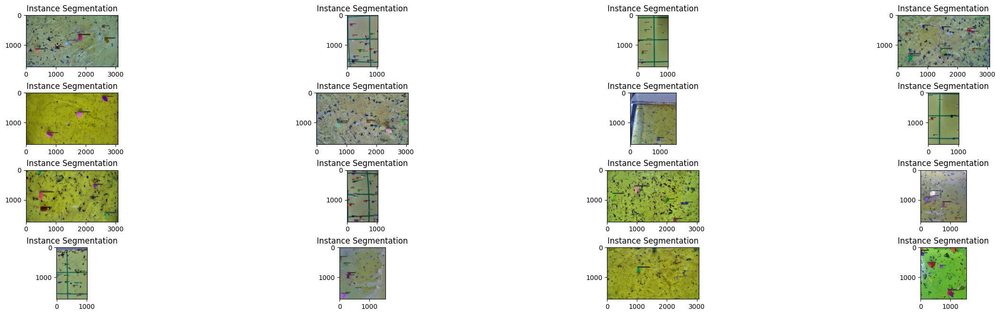

In [49]:
dataset_dicts = load_dataset("./Splitted/test/labels/*/*.json", "./Splitted/test/images/*/*.png")

fig, axis = plt.subplots(nrows=4, ncols=4, figsize=(30, 30))
plt.subplots_adjust(left=0.125, bottom=0.7, right=0.875, top=0.9, wspace=0.5, hspace=0.5)

for idx, d in enumerate(random.sample(dataset_dicts, 16)):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(
        im[:, :, ::-1],
        metadata=metadata,
        scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    axis[idx//4][idx%4].imshow(v.get_image())
    axis[idx//4][idx%4].set_title("Instance Segmentation")
plt.show()

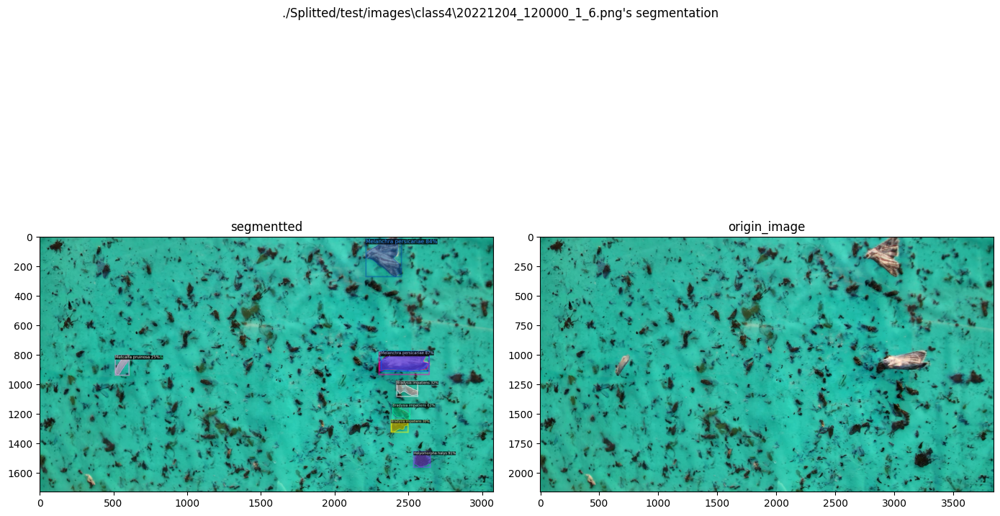

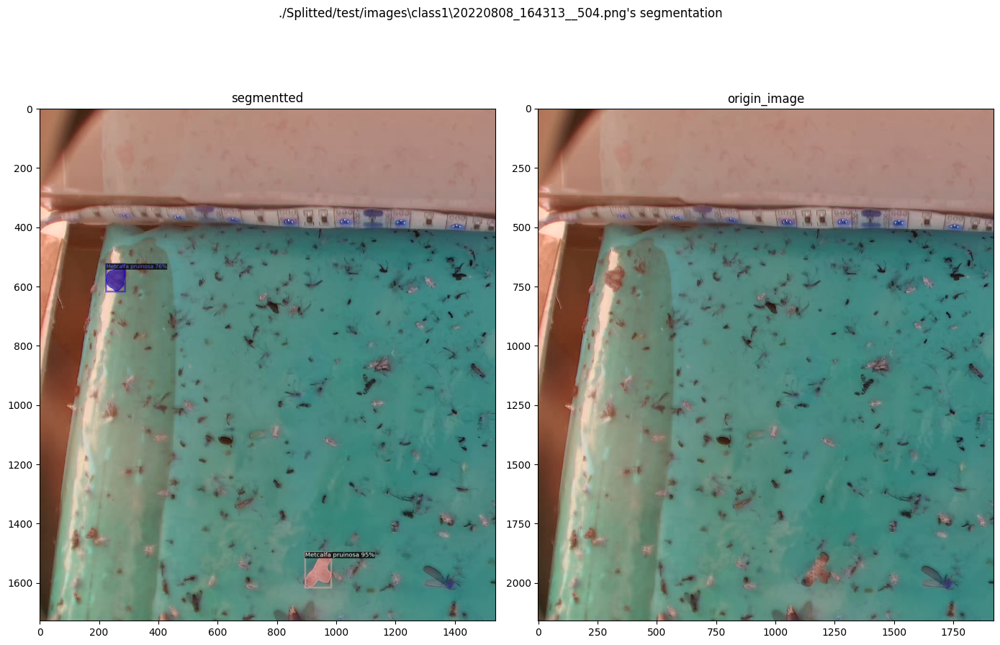

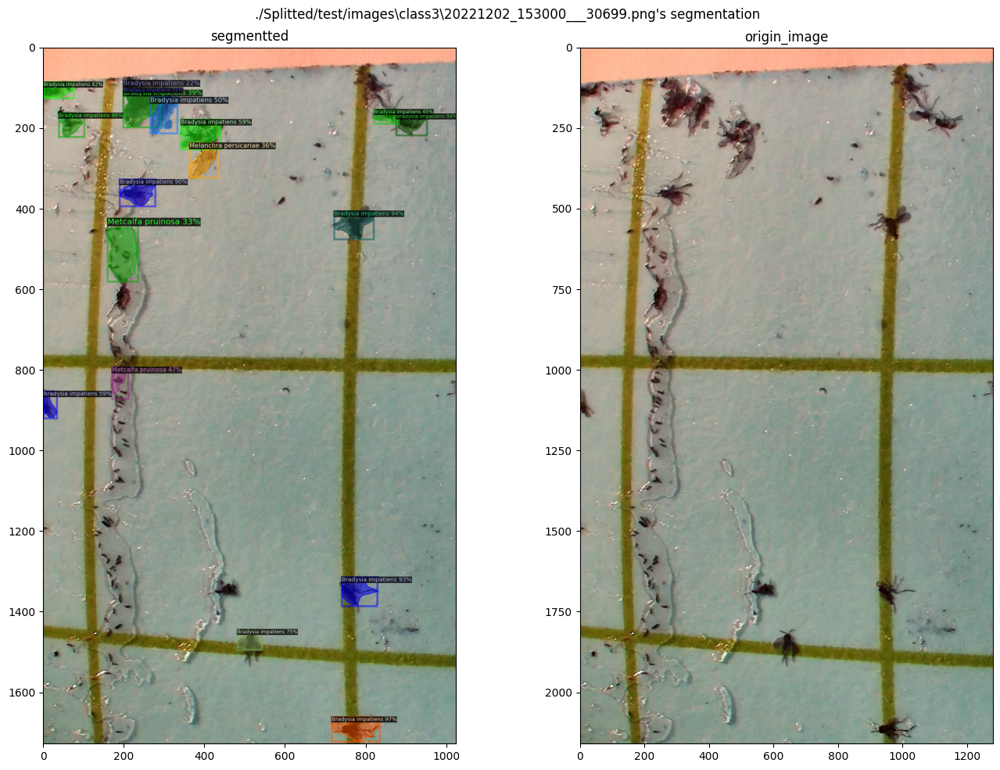

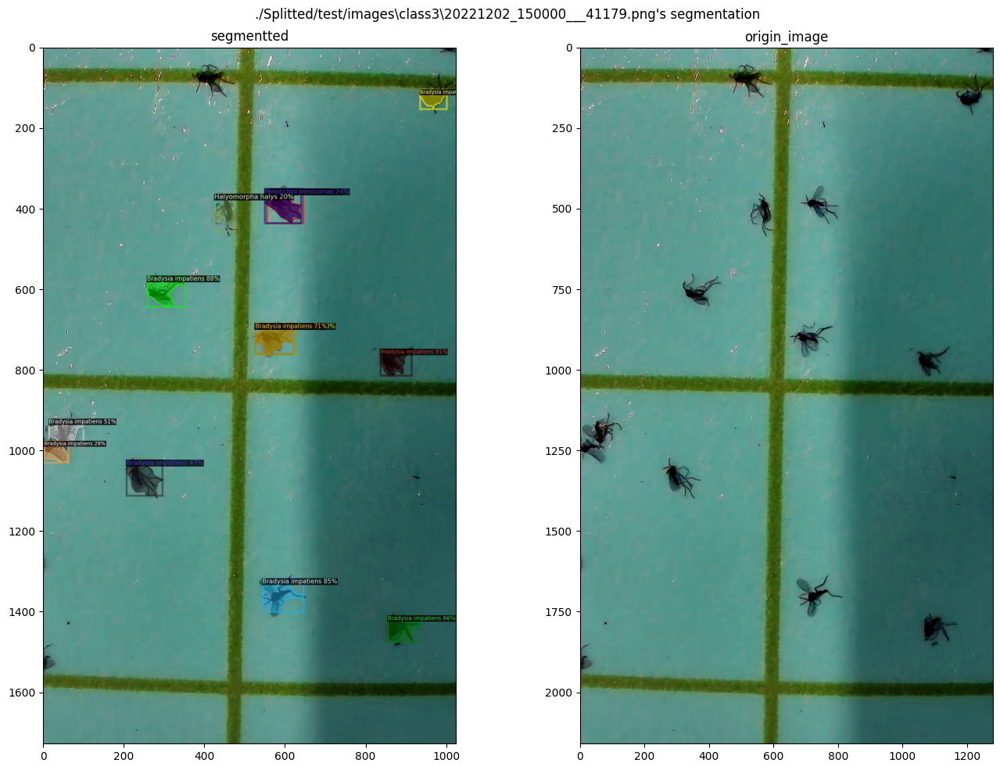

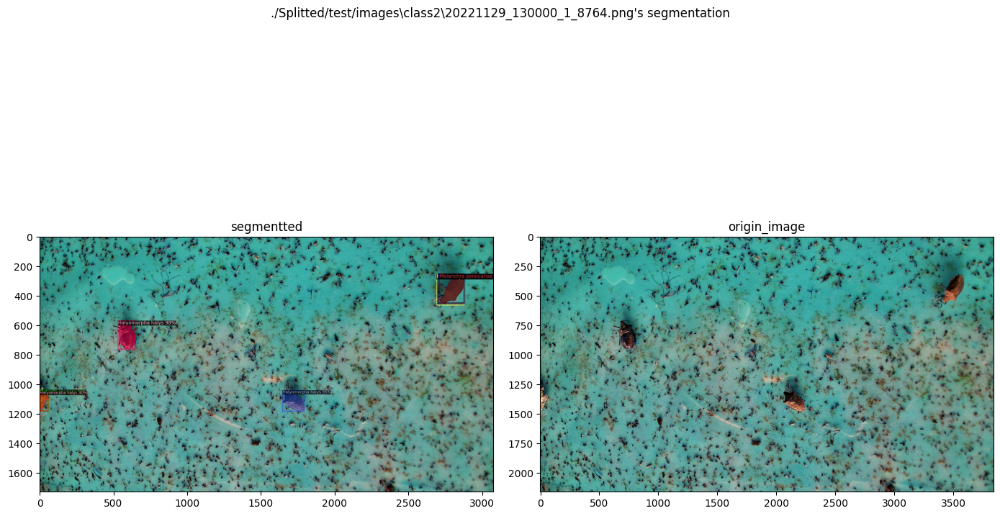

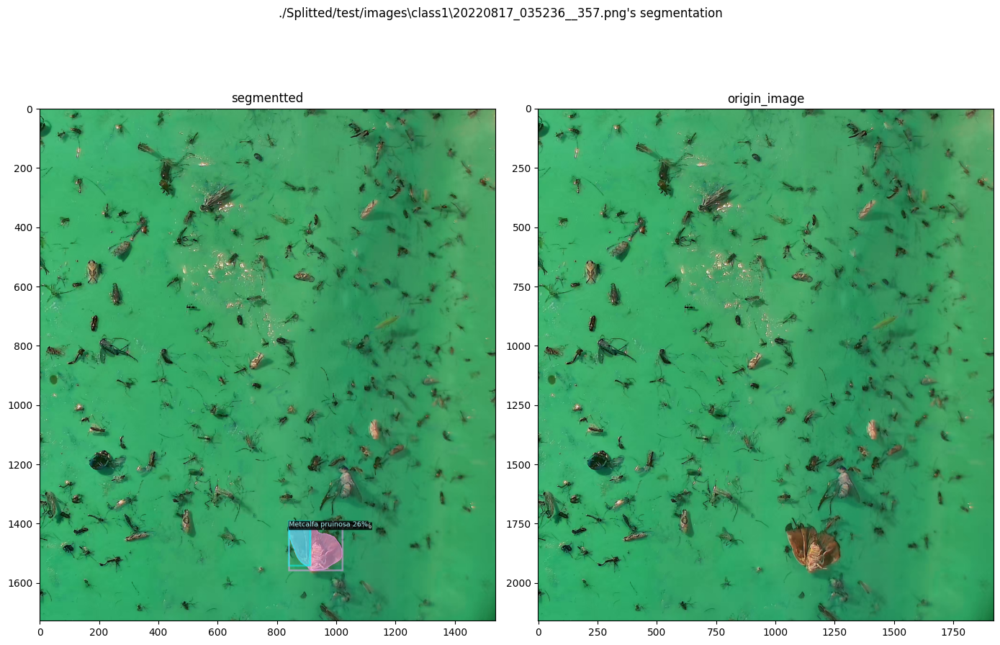

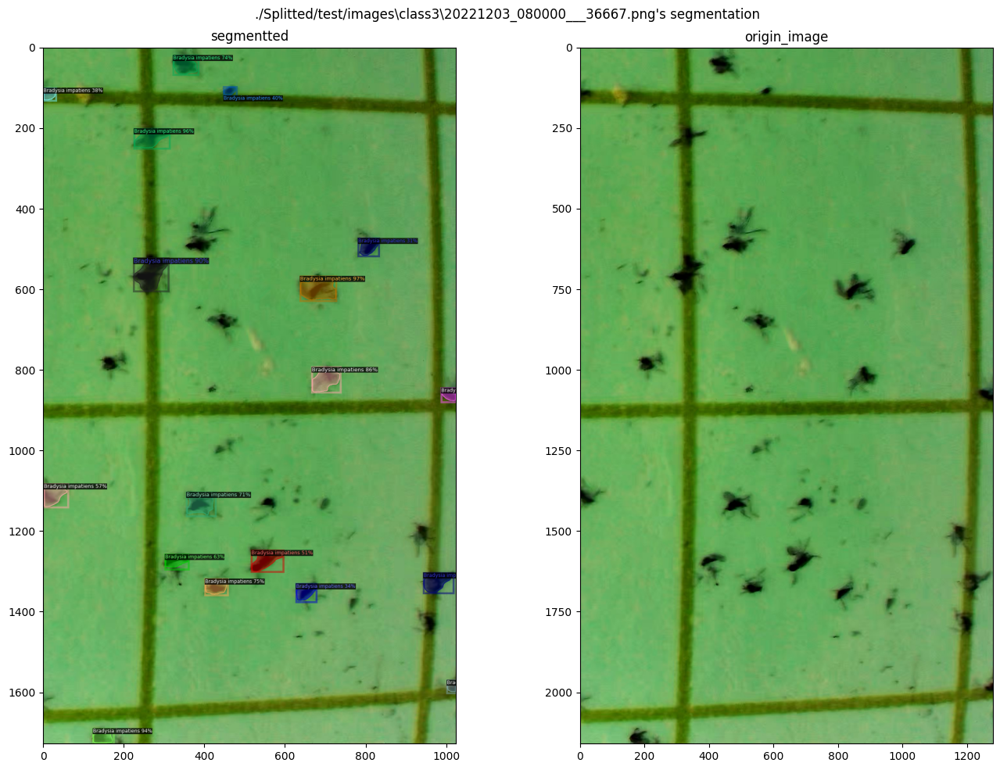

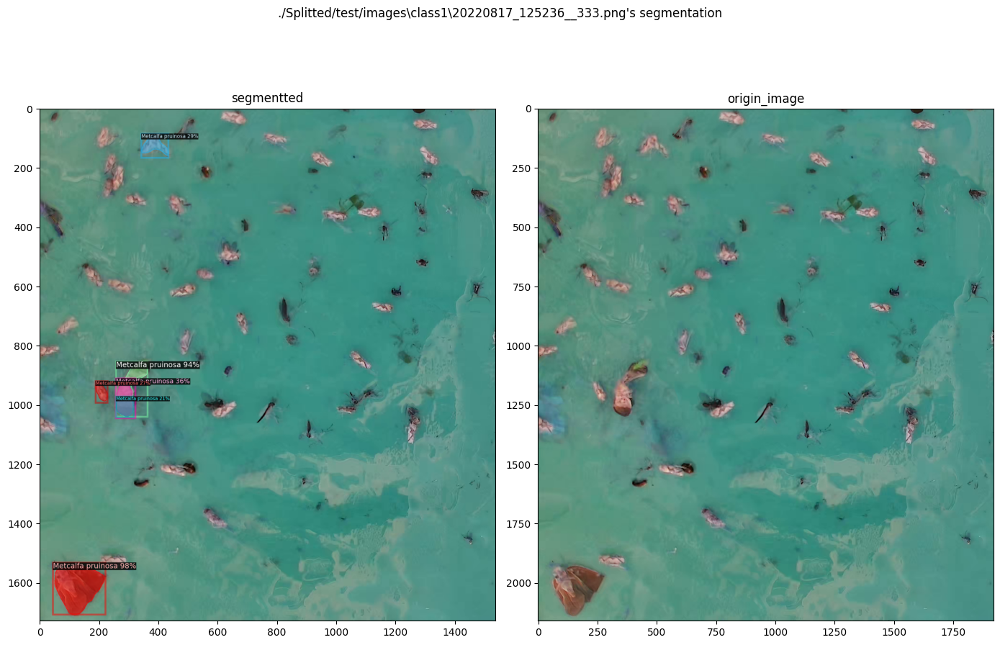

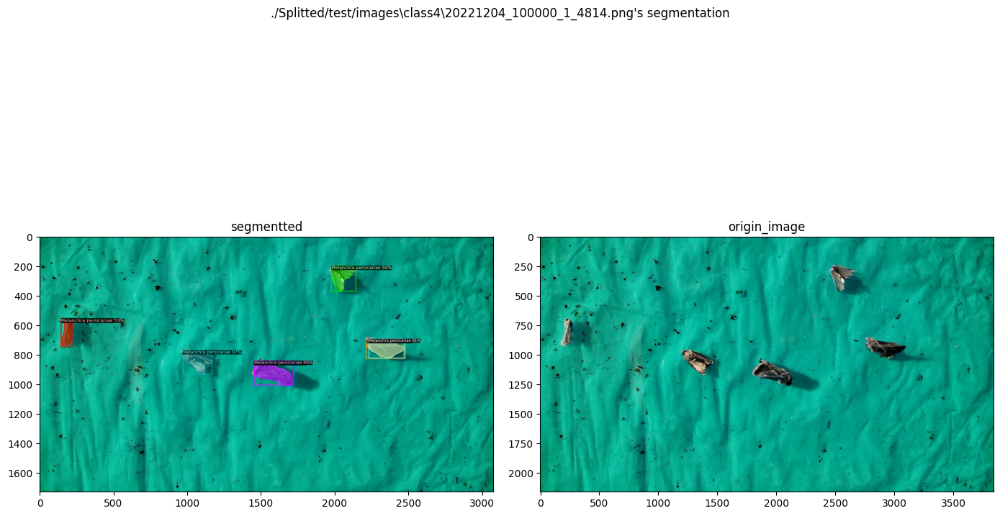

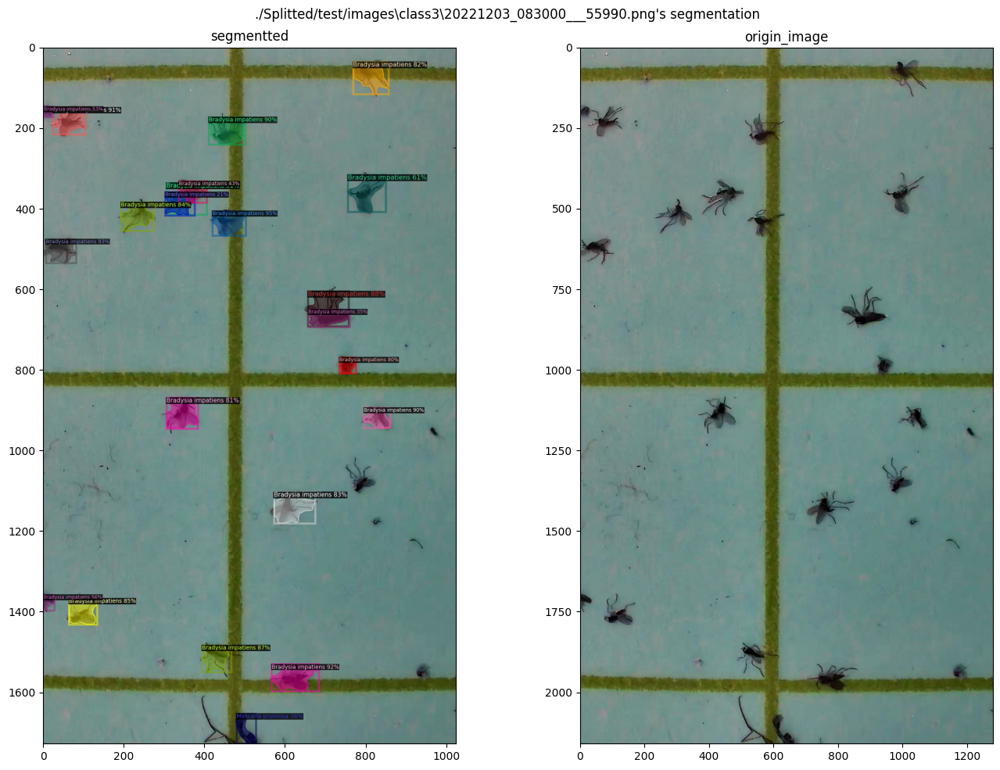

In [54]:
for d in random.sample(dataset_dicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(
        im[:, :, ::-1],
        metadata=metadata,
        scale=0.8
    )
    plt.figure(figsize=(14, 10))
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(v.get_image(), cv2.COLOR_BGR2RGB))
    plt.title("segmentted")

    plt.subplot(1, 2, 2)
    plt.imshow(im)
    plt.title("origin_image")

    plt.suptitle(f"{d['file_name']}'s segmentation")
    plt.tight_layout()

    plt.show()